In [1]:
# paraPropPython example use of paraPropPython.py notebook
# s. prohira, c. sbrocco

%matplotlib inline
import paraPropPython as ppp
import numpy as np
import matplotlib.pyplot as pl
import scipy
from scipy import signal

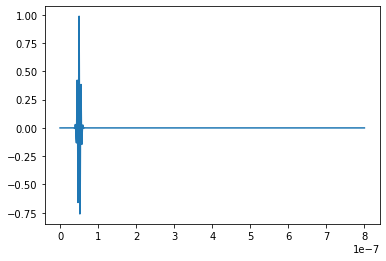

In [2]:
from paralell_scan import *
from pulse import *

In [3]:
path_to_file = 'ascan_files/'

from util import *
ascan_rx = np.load(path_to_file + 'ascan.npy')

In [4]:
freq_space = np.load(path_to_file + 'freq_space.npy') #Frequencies used in Simulation
time_space = np.load(path_to_file + 'time_space.npy') #Time space of pulse
tx_pulse_array =  np.load(path_to_file + 'tx_pulse.npy') #Transmitter pulse (complex)
tx_array = np.load(path_to_file + 'tx_array.npy') #Array of Transmitter positions (1D)
rx_array = np.load(path_to_file + 'rx_array.npy') #Array of Receiver positions (2D)

#Save Simulation Data to External File
info_file = path_to_file + 'simul_info.txt'
fout = open(info_file, 'r+')

simul_info = []
for line in fout:
    print(line)
    print(line.split())
    simul_info.append(line.split())

method =  str(simul_info[0][0])
nProfile = str(simul_info[1][0])
central_frequency = float(simul_info[2][0]) * 1e6
nSamples = int(simul_info[3][0])
sampling_interval = float(simul_info[4][0])
nyquist_frequency = float(simul_info[5][0])

tStart = 0
tEnd = nSamples*sampling_interval

print(central_frequency)
tx_pulse = pulse(A=1, f= central_frequency, tstart=tStart, tend=tEnd, tsamp=sampling_interval)
tx_pulse.real = tx_pulse_array.real
tx_pulse.imag = tx_pulse_array.imag
tx_pulse.abs = abs(tx_pulse_array)

func	#method

['func', '#method']
southpole	nProfile

['southpole', 'nProfile']
500.0	#Central-Frequency-MHz

['500.0', '#Central-Frequency-MHz']
1999	#Number-Samples

['1999', '#Number-Samples']
5e-10	#Sampling-interval-s

['5e-10', '#Sampling-interval-s']
999999999.9999999	#nyquist-freauency-Hz

['999999999.9999999', '#nyquist-freauency-Hz']
2021.05.05.22:29:39	#datetime

['2021.05.05.22:29:39', '#datetime']
500000000.0


In [5]:
Range_list = rx_array[0,:,0]
sourceDepth_list = tx_array[:]
receiverDepth_list = rx_array[:,0,1]

nRanges = len(Range_list)
nSources = len(sourceDepth_list)
nDepths_rx = len(receiverDepth_list)
print(receiverDepth_list)

[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32. 34.
 36. 38. 40. 42. 44. 46. 48. 50.]


80.0 10.0


/home/alex/miniconda2/envs/myenv/lib/python3.7/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


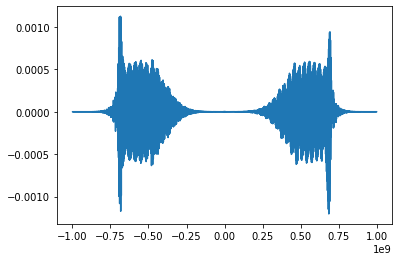

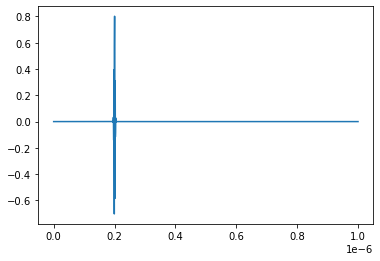

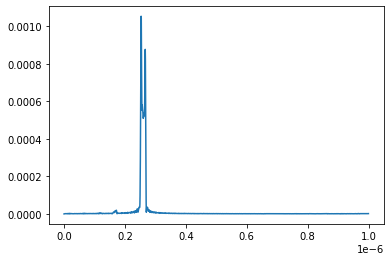

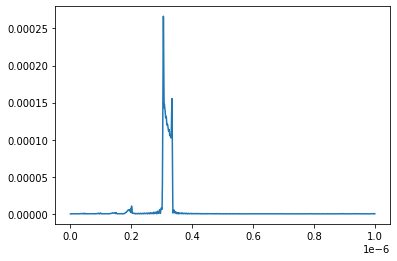

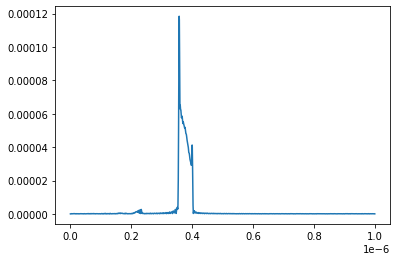

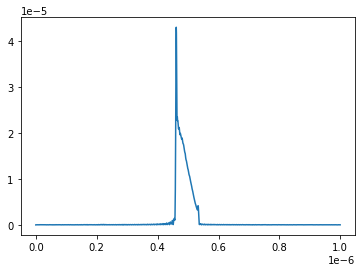

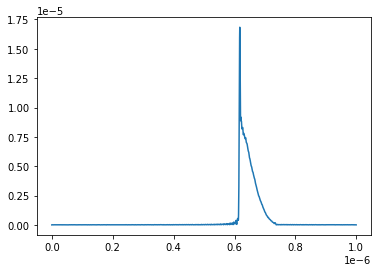

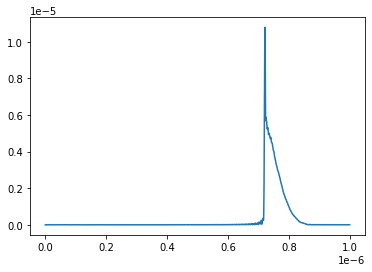

In [6]:
spectrum_rx = ascan_rx[:,0,4,5]
print(Range_list[4], sourceDepth_list[5])

pl.plot(tx_pulse.freq_space, spectrum_rx)
pl.show()

pulse_rx = np.fft.ifft(spectrum_rx)
pl.plot(tx_pulse.time_space, tx_pulse.real)
pl.show()

range_scan = np.zeros((nRanges, tx_pulse.nSamples))
for i in range(nRanges):
    spectrum_rx = ascan_rx[:,0,i,0]
    nHalf = int(len(spectrum_rx)/2)
    spectrum_rx[:nHalf] = np.zeros(nHalf)
    
    pulse_rx = np.fft.ifft(spectrum_rx)
    pulse_rx = butterBandpassFilter(pulse_rx, 0.25e9,0.75e9, 1/sampling_interval,4)
    pl.plot(tx_pulse.time_space, abs(pulse_rx))
    pl.show()
    
    range_scan[i,:] = abs(pulse_rx)

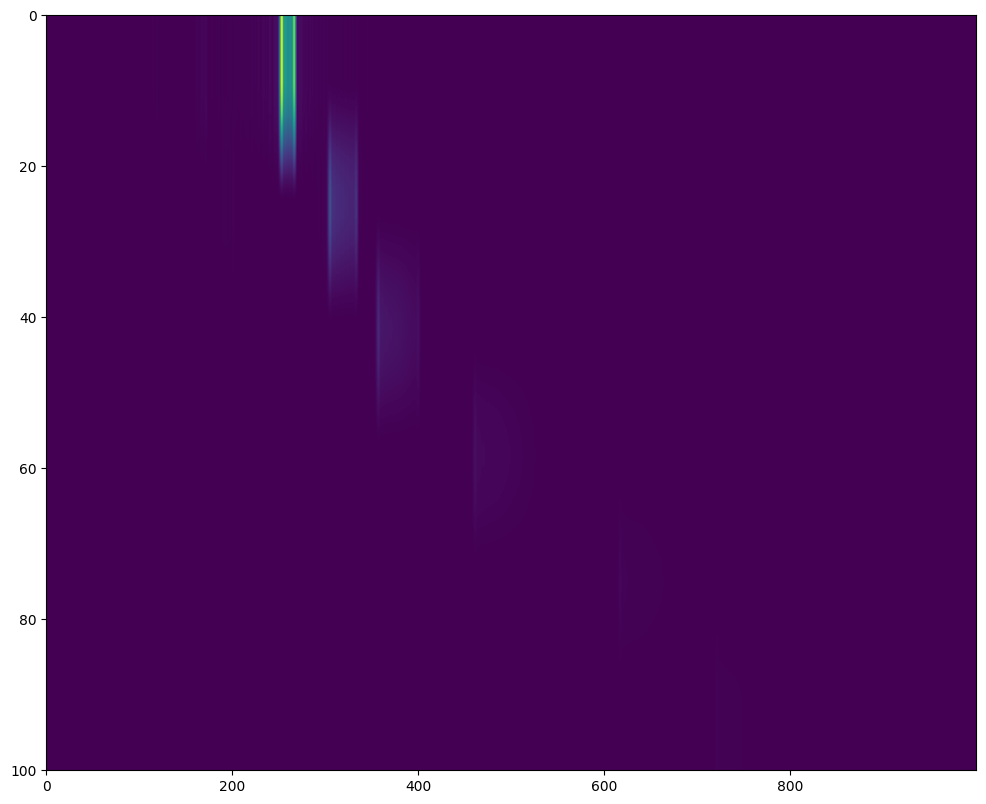

In [7]:
fig=pl.figure(figsize=(12,10), dpi =100)
ax = fig.add_subplot(111)
pl.imshow(range_scan, extent=(0,max(tx_pulse.time_space)*1e9, max(Range_list), 0),aspect='auto')
pl.show()

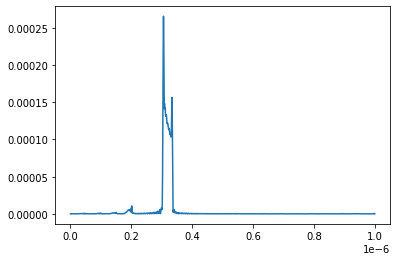

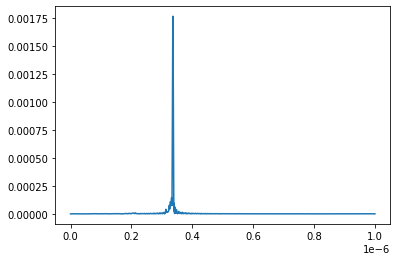

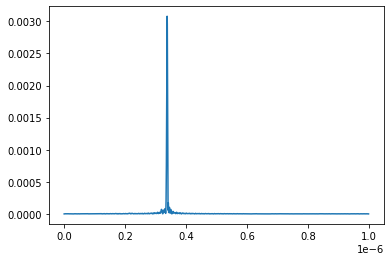

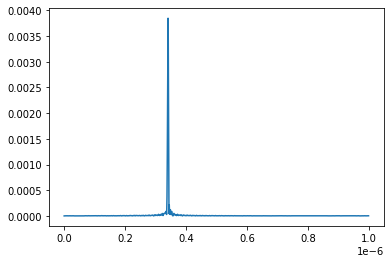

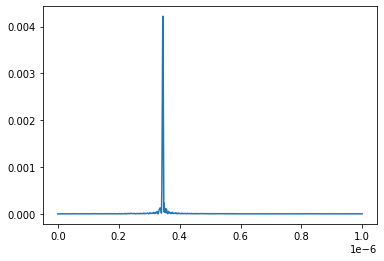

...

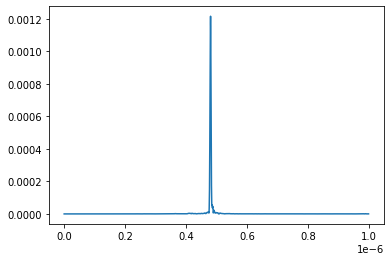

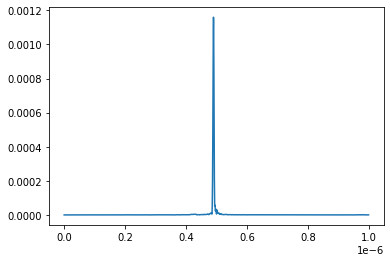

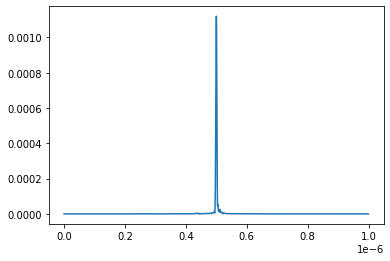

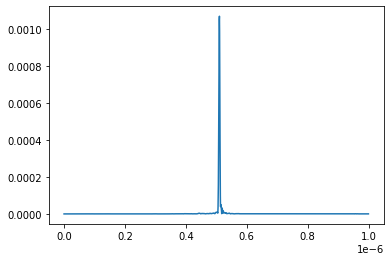

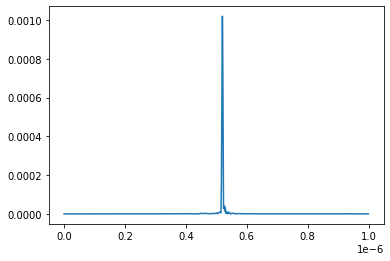

In [8]:
depth_scan = np.zeros((nDepths_rx, tx_pulse.nSamples))

for i in range(nDepths_rx):
    spectrum_rx = ascan_rx[:,0,1,i]
    nHalf = int(len(spectrum_rx)/2)
    spectrum_rx[:nHalf] = np.zeros(nHalf)
    
    pulse_rx = np.fft.ifft(spectrum_rx)
    pulse_rx = butterBandpassFilter(pulse_rx, 0.25e9,0.75e9, 1/sampling_interval,5)
    pl.plot(tx_pulse.time_space, abs(pulse_rx))
    pl.show()
    
    depth_scan[i,:] = abs(pulse_rx)

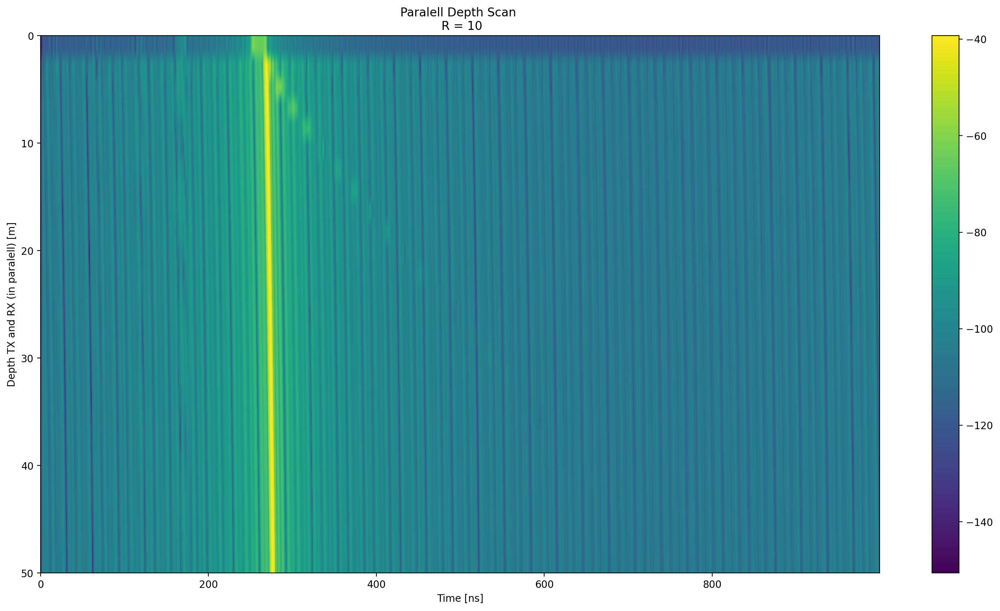

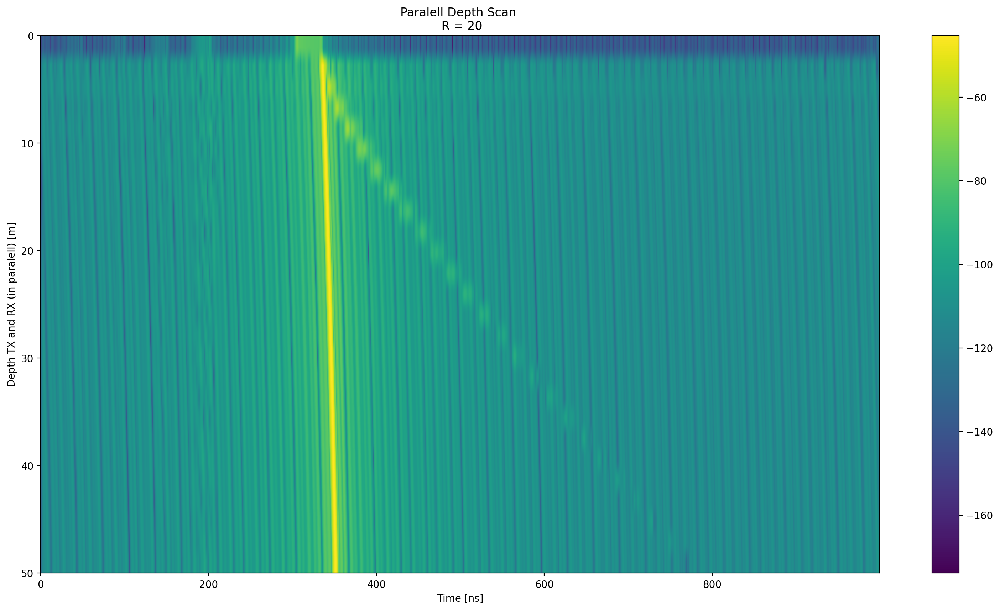

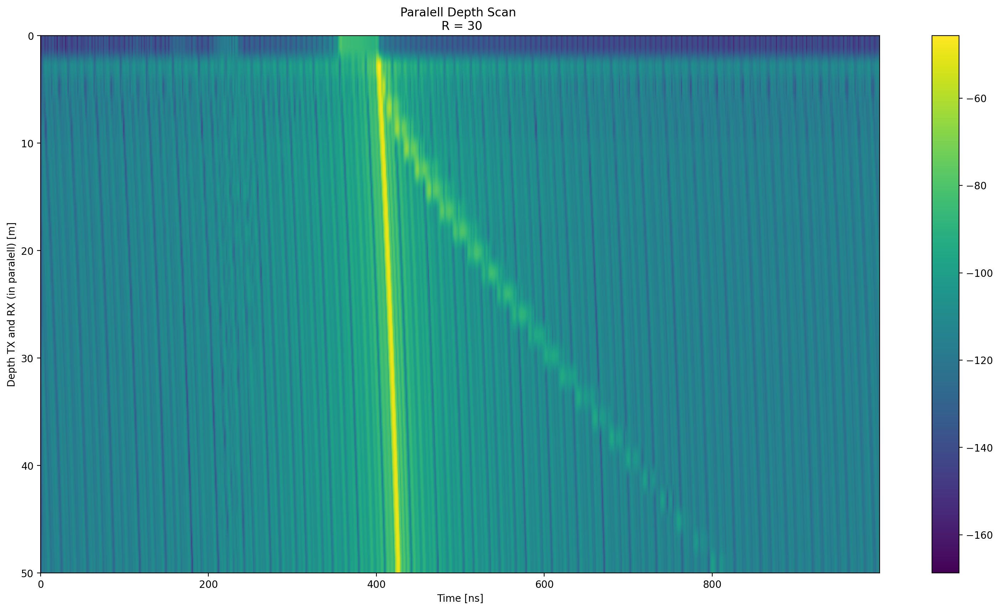

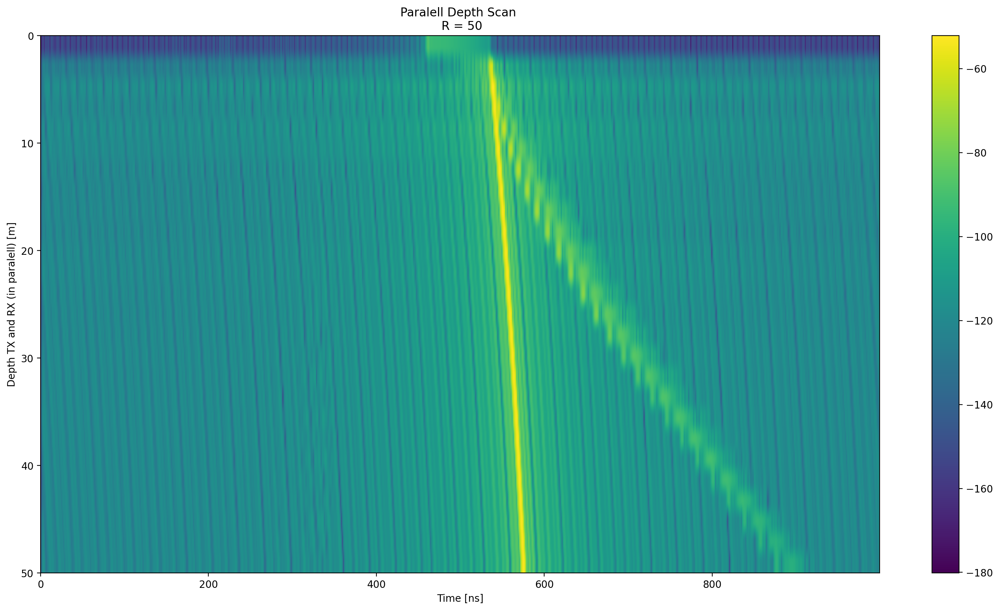

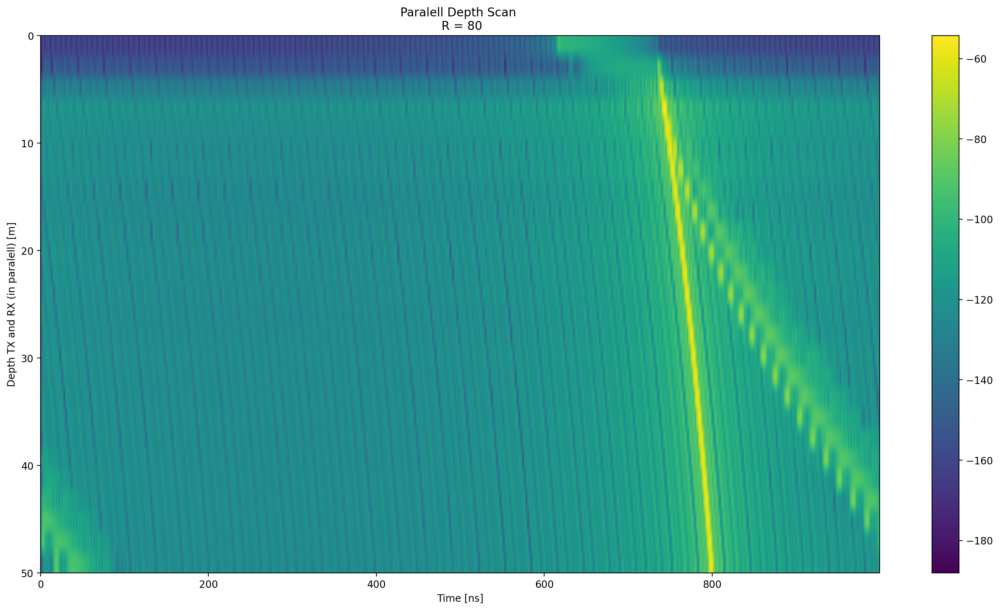

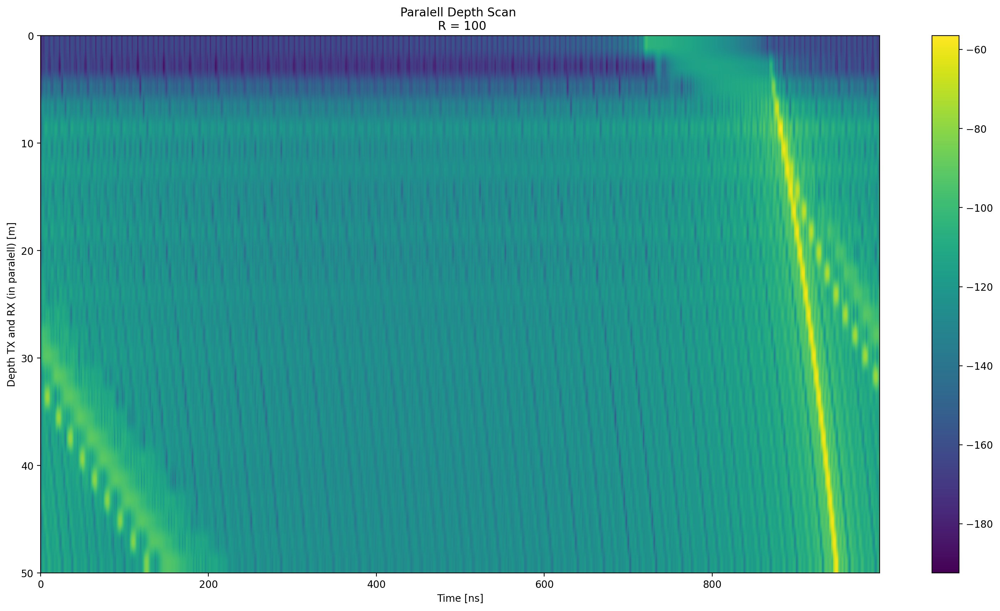

In [18]:
# Paralell Scan

for j in range(nRanges):
    depth_scan = np.zeros((nDepths_rx, tx_pulse.nSamples))

    for i in range(nDepths_rx):
        spectrum_rx = ascan_rx[:,i,j,i]
        nHalf = int(len(spectrum_rx)/2)
        spectrum_rx[:nHalf] = np.zeros(nHalf)

        pulse_rx = np.fft.ifft(spectrum_rx)
        pulse_rx = butterBandpassFilter(pulse_rx, 0.25e9,0.75e9, 1/sampling_interval,5)
       

        depth_scan[i,:] = abs(pulse_rx)**2
        #depth_scan[i,:] = pulse_rx.real
    fig=pl.figure(figsize=(19,10), dpi =200)
    ax = fig.add_subplot(111)
    ax.set_title('Paralell Depth Scan \n R = ' + str(int(Range_list[j])))
    #ax.imshow(10*np.log10(depth_scan), extent=(0,max(tx_pulse.time_space)*1e9, max(sourceDepth_list), 0), aspect='auto')
    pmesh = ax.imshow(10*np.log10(depth_scan), extent=(0,max(tx_pulse.time_space)*1e9, max(sourceDepth_list), 0), aspect='auto')
    cbar = pl.colorbar(pmesh)

    ax.set_ylabel('Depth TX and RX (in paralell) [m]')
    ax.set_xlabel('Time [ns]')
    
    
    if i == nRanges -1:
        ax.set_xlabel('Time [ns]')
    if i == 0:
        ax.set_ylabel('Depth [m]')
    pl.show()

In [11]:
#Wavefront emanating from source depth:
sourceDepth = 20
id_tx = util.findNearest(tx_array, sourceDepth)
print(id_tx, tx_array[id_tx])

10 20.0


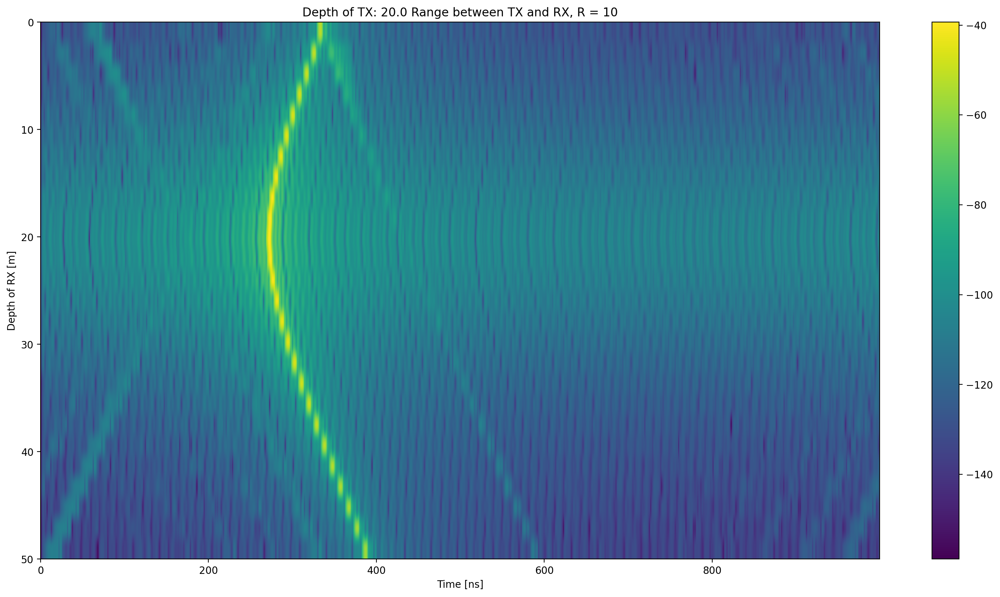

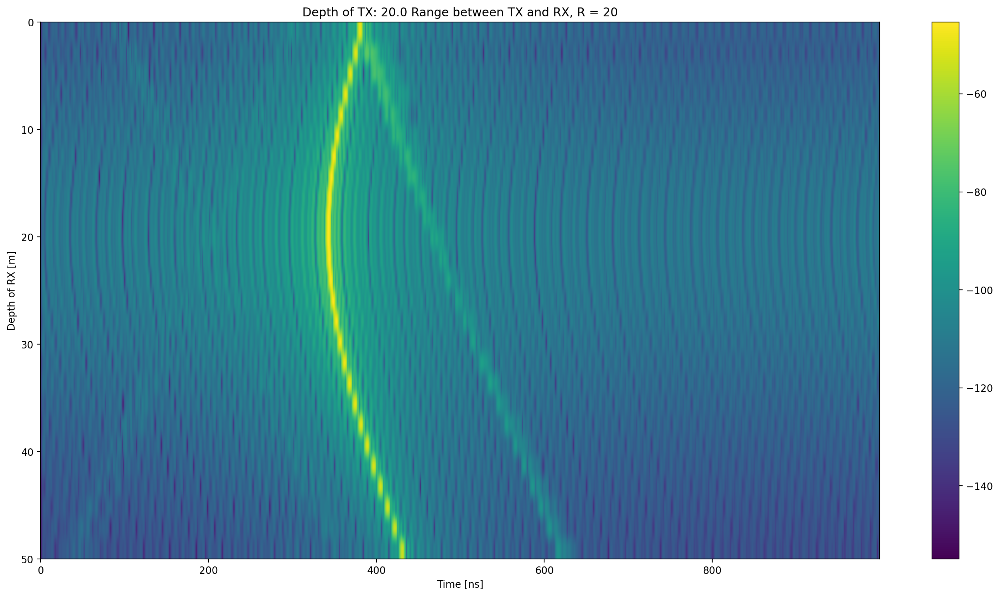

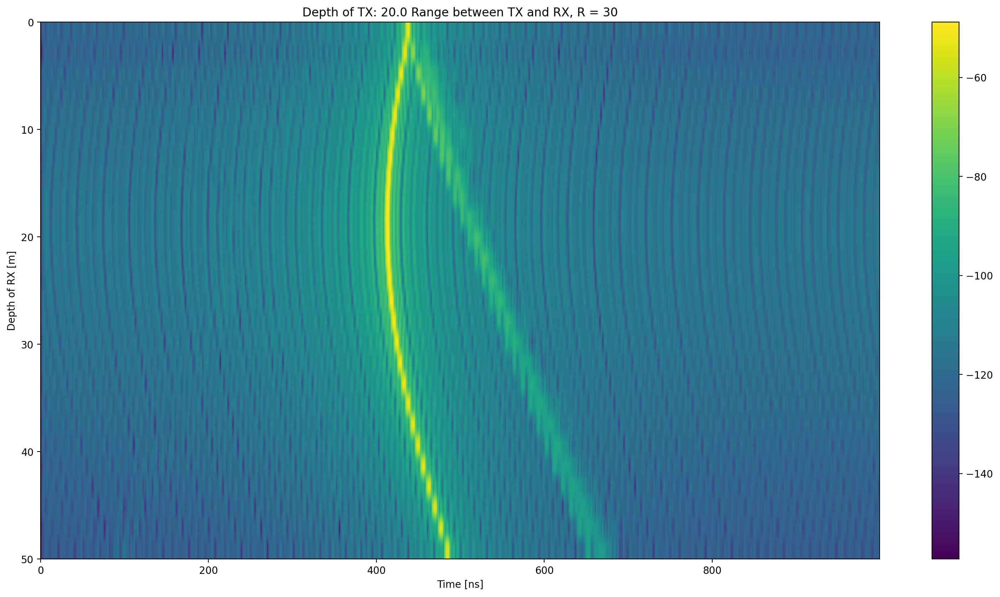

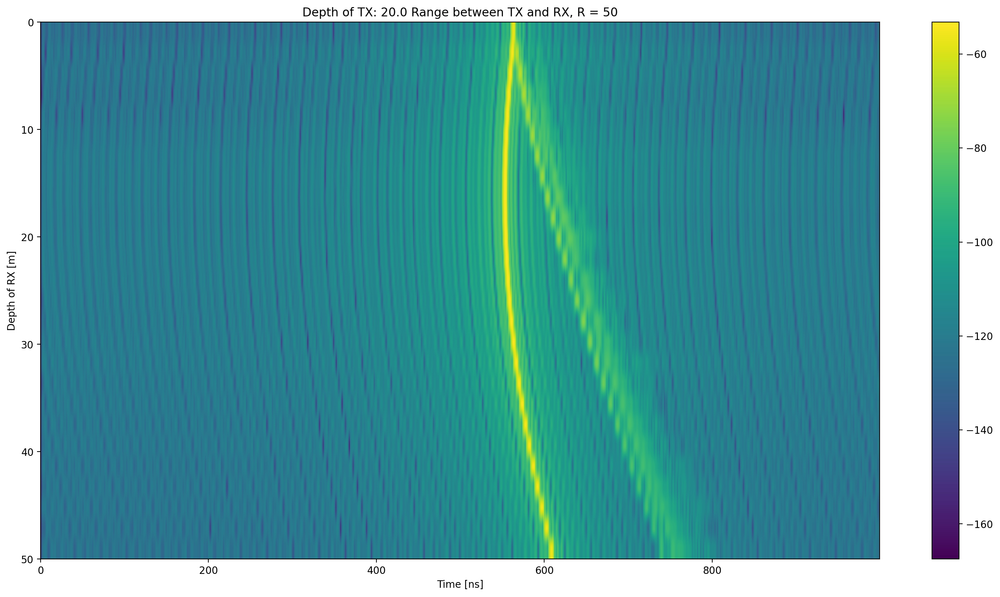

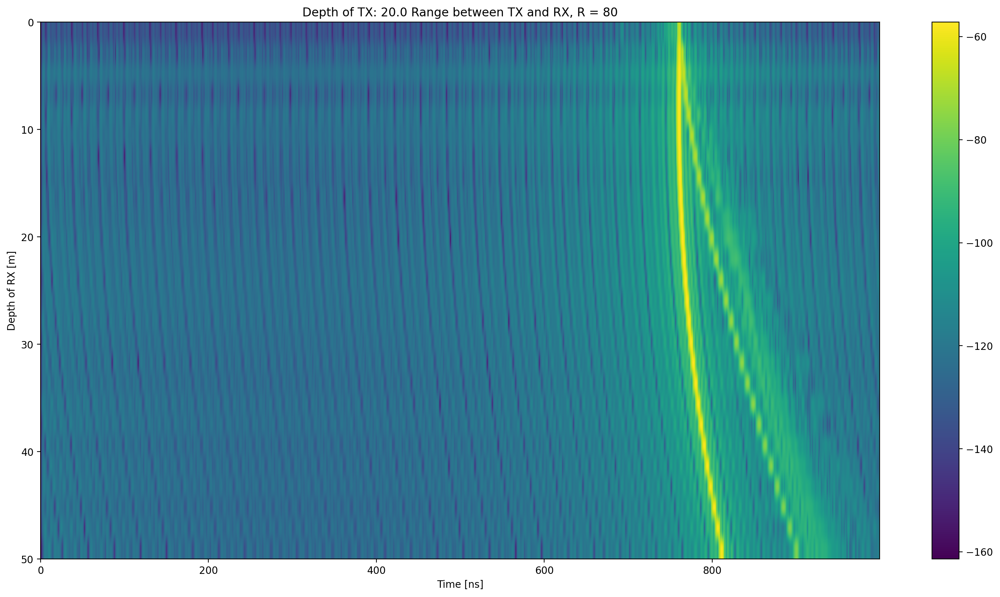

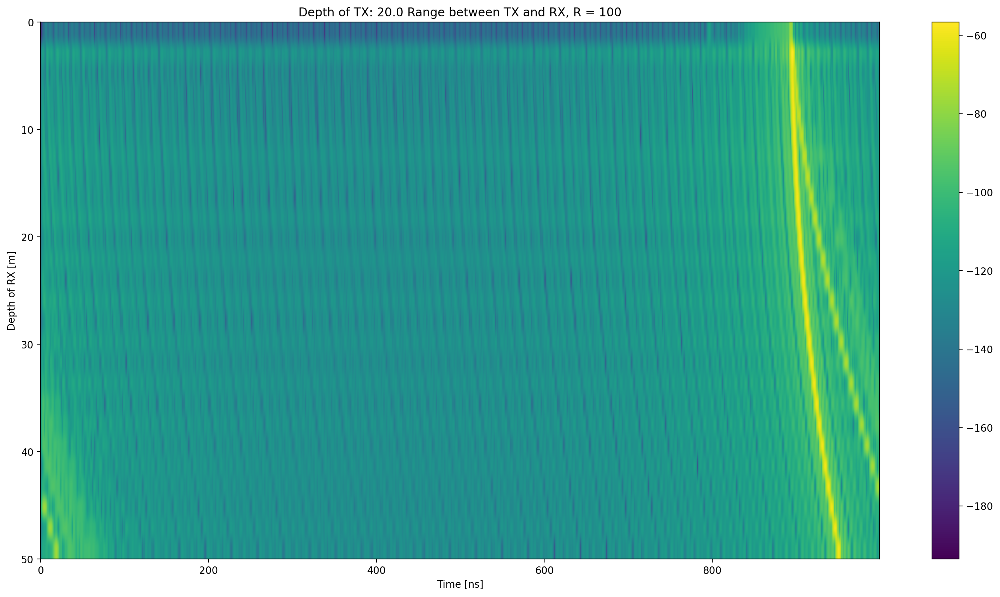

In [16]:
for j in range(nRanges):
    depth_scan = np.zeros((nDepths_rx, tx_pulse.nSamples))

    for i in range(nDepths_rx):
        spectrum_rx = ascan_rx[:,id_tx,j,i]
        nHalf = int(len(spectrum_rx)/2)
        spectrum_rx[:nHalf] = np.zeros(nHalf)

        pulse_rx = np.fft.ifft(spectrum_rx)
        pulse_rx = butterBandpassFilter(pulse_rx, 0.25e9,0.75e9, 1/sampling_interval,5)
       

        depth_scan[i,:] = abs(pulse_rx)**2
        #depth_scan[i,:] = pulse_rx.real
    fig=pl.figure(figsize=(19,10), dpi = 200)
    ax = fig.add_subplot(111)
    ax.set_title('Fixed Depth Scan \n Depth of TX: ' + str(tx_array[id_tx]) + ' Range between TX and RX, R = ' + str(int(Range_list[j])))
    #ax.imshow(10*np.log10(depth_scan), extent=(0,max(tx_pulse.time_space)*1e9, max(sourceDepth_list), 0), aspect='auto')
    pmesh = ax.imshow(10*np.log10(depth_scan), extent=(0,max(tx_pulse.time_space)*1e9, max(sourceDepth_list), 0), aspect='auto')
    cbar = pl.colorbar(pmesh)

    ax.set_ylabel('Depth of RX [m]')
    ax.set_xlabel('Time [ns]')
    
    
    if i == nRanges -1:
        ax.set_xlabel('Time [ns]')
    if i == 0:
        ax.set_ylabel('Depth [m]')
    pl.show()